# Análise Exploratória de Dados: Vendas de Imóveis em King County, USA 🏠

## Introdução
Esta análise exploratória de dados (EDA) investiga o conjunto de dados de vendas de imóveis no Condado de King, Washington, EUA, entre maio de 2014 e maio de 2015. O dataset contém informações detalhadas sobre preços de venda e características dos imóveis.

## Objetivos da Análise
1. Compreender a distribuição dos preços dos imóveis
2. Identificar padrões e correlações entre as características dos imóveis e seus preços
3. Analisar a distribuição geográfica das vendas
4. Investigar fatores que mais influenciam o valor dos imóveis

## Estrutura da Análise
- Carregamento e Visão Geral dos Dados
- Análise Univariada das Variáveis
- Análise de Correlações
- Análise Geoespacial
- Insights e Conclusões

## Dataset
Temos 21 colunas no conjunto de dados, como segue:

* **id**: ID único para cada casa vendida
* **date**: Data da venda da casa
* **price**: Preço de cada casa vendida
* **bedrooms**: Número de quartos
* **bathrooms**: Número de banheiros, onde 0,5 conta para um cômodo com vaso sanitário, mas sem chuveiro
* **sqft living**: Metragem quadrada do espaço interno habitável do apartamento
* **sqft lot**: Metragem quadrada do terreno
* **floors**: Número de andares
* **waterfront**: Uma variável dummy para indicar se o apartamento tinha vista para a orla ou não
* **view**: Um índice de 0 a 4 de quão boa era a vista da propriedade
* **condition**: Um índice de 1 a 5 sobre a condição do apartamento
* **grade**: Um índice de 1 a 13, onde 1 fica aquém da construção e design do edifício e 13 tem um alto nível de qualidade de construção e design
* **sqft above**: A metragem quadrada do espaço interno da casa que está acima do nível do solo
* **sqft basement**: A metragem quadrada do espaço interno da casa que está abaixo do nível do solo
* **yr built**: O ano em que a casa foi construída inicialmente
* **yr renovated**: O ano da última reforma da casa
* **zipcode**: A área do CEP em que a casa está localizada
* **lat**: Latitude
* **long**: Longitude
* **sqft living15**: A metragem quadrada do espaço interno habitável das 15 casas vizinhas mais próximas
* **sqft lot15**: A metragem quadrada dos terrenos das 15 casas vizinhas mais próximas.

In [1]:
# IMPORTANDO AS BIBLIOTECAS NECESSÁRIAS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

import folium
from folium.plugins import HeatMap

import os
import kagglehub

# Statistical analysis
from scipy import stats


# Filtrar avisos.
import warnings
warnings.filterwarnings('ignore')

### Configurações de Visualização
%matplotlib inline


<hr>

### Carregamento e Visão Geral dos Dados

In [2]:
os.makedirs('output', exist_ok=True)
path = kagglehub.dataset_download("harlfoxem/housesalesprediction")
df = pd.read_csv(os.path.join(path, os.listdir(path)[0]))
df.to_csv('output/house_sales.csv', index=False)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


<hr>

### Função para uma visão geral do dataset
Iremos criar uma função para verificar as principais características do dataset, como:
- Tamanho do dataset
- Tipos de dados
- Valores nulos
- Primeiras linhas do dataset
- Valores duplicados



In [3]:
def data_info(df):
    info = pd.DataFrame({
        'dtypes': df.dtypes,
        'Missing': df.isna().sum(),
        'Unique': df.nunique(),
        'Example': df.iloc[0],
        'Entropy': [round(stats.entropy(df[col].value_counts(normalize=True), base=2), 2) 
                   for col in df.columns]
    })
    
    print(f"Dataset Shape: {df.shape}")
    return info

In [4]:
print(f'Duplicated rows: {df.duplicated().sum()}')
data_info(df)

Duplicated rows: 0
Dataset Shape: (21613, 21)


,dtypes,Missing,Unique,Example,Entropy
id,int64,0,21436,7129300520,14.38
date,object,0,372,20141013T000000,8.11
price,float64,0,4028,221900.0,10.16
bedrooms,int64,0,13,3,1.88
bathrooms,float64,0,30,1.0,3.19
sqft_living,int64,0,1038,1180,8.52
sqft_lot,int64,0,9782,5650,12.12
floors,float64,0,6,1.0,1.54
waterfront,int64,0,2,0,0.06
view,int64,0,5,0,0.64


**Comentário:** Essa função é útil para ter uma visão geral e rápida do dataset e identificar possíveis problemas que precisam ser tratados antes de prosseguir com a análise. Mas os já apresentam uma boa qualidade, sem valores nulos ou duplicados, sem variáveis `Objects`, apenas com dados numéricos e alguns categóricos.



<hr>

### Análise das variáveis numéricas

In [5]:
df.select_dtypes(include='number').describe().T

,count,mean,std,min,25%,50%,75%,max
id,21613.0,4.580302e+09,2.876566e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21613.0,5.400881e+05,3.671272e+05,7.500000e+04,3.219500e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21613.0,3.370842e+00,9.300618e-01,0.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21613.0,2.114757e+00,7.701632e-01,0.000000e+00,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21613.0,2.079900e+03,9.184409e+02,2.900000e+02,1.427000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21613.0,1.510697e+04,4.142051e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068800e+04,1.651359e+06
floors,21613.0,1.494309e+00,5.399889e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21613.0,7.541757e-03,8.651720e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21613.0,2.343034e-01,7.663176e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21613.0,3.409430e+00,6.507430e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


**Comentário:** Algumas variáveis possuem uma distribuição assimétrica como `price`, `sqft living`, `sqft lot`, `sqft above`, `sqft basement`, `sqft living15` e `sqft lot15`. Essas variáveis podem ser transformadas para melhorar a normalidade da distribuição, como a transformação logarítmica ou escalar. Outras variáveis como `view`, `condition` e `grade` são variáveis categóricas que podem ser analisadas separadamente.

<hr>

### Análise de preços dos imóveis

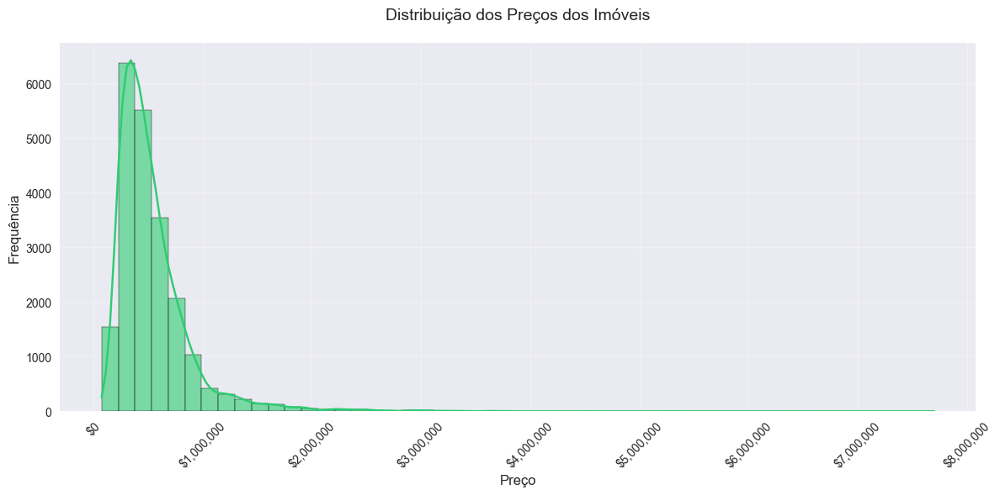

In [6]:
# Configurar o estilo
plt.style.use('seaborn')
plt.figure(figsize=(12, 6))

# Criar o histograma
sns.histplot(
    data=df,
    x='price',
    bins=50,
    kde=True,
    color='#2ecc71',
    alpha=0.6,
    edgecolor='black'
)

# Personalizar o gráfico
plt.title('Distribuição dos Preços dos Imóveis', pad=20, fontsize=14)
plt.xlabel('Preço', fontsize=12)
plt.ylabel('Frequência', fontsize=12)

# Formatar eixo x para mostrar valores em milhões com $
plt.gca().xaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
plt.xticks(rotation=45)

# Adicionar grid
plt.grid(True, alpha=0.3)

# Ajustar layout
plt.tight_layout()
plt.show()

**Comentário:** A variável `price` apresenta uma distribuição assimétrica à direita, com a maioria dos imóveis vendidos na faixa de até 1 milhão de dólares. Há também alguns imóveis vendidos por valores muito altos, o que pode indicar a presença de outliers.

<hr>

### Análise de Correlação: Variáveis Numéricas vs Preço

**Objetivo**
Cria uma matriz de gráficos de dispersão (scatter plots) para visualizar a relação entre todas as variáveis numéricas do dataset e o preço dos imóveis. Especificamente:


1. Organiza os gráficos em uma grade 3x3
2. Para cada variável, cria um scatter plot onde:
   - Eixo X: valor da variável
   - Eixo Y: preço do imóvel
   - Cor dos pontos: gradiente baseado no preço
   - Escala do eixo Y: formatada em milhões de dólares


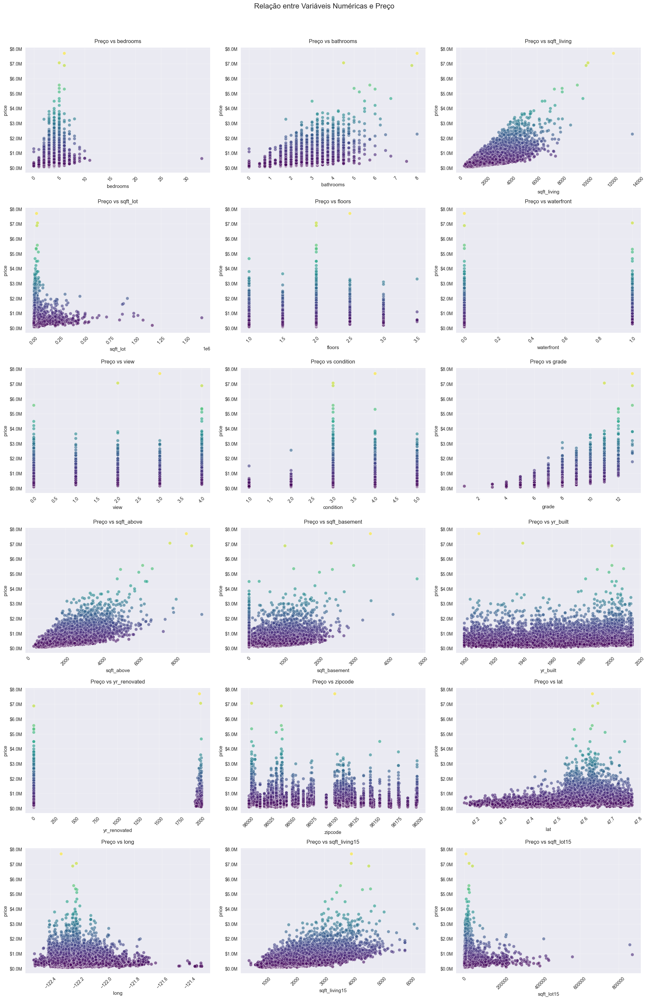

In [7]:
# Selecionar apenas as colunas numéricas, excluindo 'id' e 'price'
numeric_cols = df.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['id', 'price']]

# Configurar o estilo
plt.style.use('seaborn')
sns.set_palette("husl")

# Calcular o número de linhas necessárias
n_cols = 3
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols

# Criar a figura
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows))
axes = axes.flatten()

# Criar scatterplots
for idx, col in enumerate(numeric_cols):
    sns.scatterplot(
        data=df,
        x=col,
        y='price',
        hue='price',
        palette='viridis',
        alpha=0.6,
        s=50,
        ax=axes[idx]
    )
    
    # Formatar o eixo y (preço) em milhões
    axes[idx].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x/1e6:.1f}M'))
    
    
    # Remover a legenda
    axes[idx].get_legend().remove()
    
    # Adicionar título
    axes[idx].set_title(f'Preço vs {col}', pad=10)
    
    # Rotacionar labels do eixo x
    axes[idx].tick_params(axis='x', rotation=45)
    
    # Adicionar grid
    axes[idx].grid(True, alpha=0.3)

# Remover subplots vazios
for idx in range(len(numeric_cols), len(axes)):
    fig.delaxes(axes[idx])

# Ajustar o layout
plt.suptitle('Relação entre Variáveis Numéricas e Preço', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

**Comentários:**

**Correlações Fortes Positivas:**
- `sqft_living`: Área habitável mostra a correlação mais forte com o preço, indicando que imóveis maiores tendem a ser mais caros
- `grade`: Qualidade e condição do imóvel tem forte influência no preço
- `sqft_above`: Área acima do solo também apresenta correlação positiva

**Correlações Aparentemente Fracas:**
- `yr_built`: Ano de construção tem correlação fraca positiva
- `floors`: Número de andares mostra padrão disperso


<hr>

### Criando features novas a partir de datas existentes
**Objetivo:** Criar novas variáveis a partir da variável `date` para facilitar a análise temporal dos dados. As novas variáveis incluem:
- `year`: Ano da venda
- `month`: Mês da venda
- `day`: Dia da venda

Também excluiremos a variável `date` original e `id`, pois não é mais necessária.

In [8]:
df_sample = df.drop(columns=['id'])
df_sample.date = pd.to_datetime(df_sample.date)
df_sample['year'] = df_sample.date.dt.year
df_sample['month'] = df_sample.date.dt.month
df_sample['day'] = df_sample.date.dt.day
df_sample.head(2)

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,day
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,...,1955,0,98178,47.5112,-122.257,1340,5650,2014,10,13
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,...,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12,9


### Salvando uma lista com a variáveis numéricas

In [9]:
colunas_numericas = df_sample.select_dtypes(include='number').columns.tolist()

<hr>

### Criando uma matriz de correlação
**Objetivo:** Criar uma matriz de correlação para visualizar a relação entre as variáveis numéricas. A matriz é criada utilizando o método `corr()` do pandas, que calcula a correlação de Spearman entre as variáveis numéricas do DataFrame.

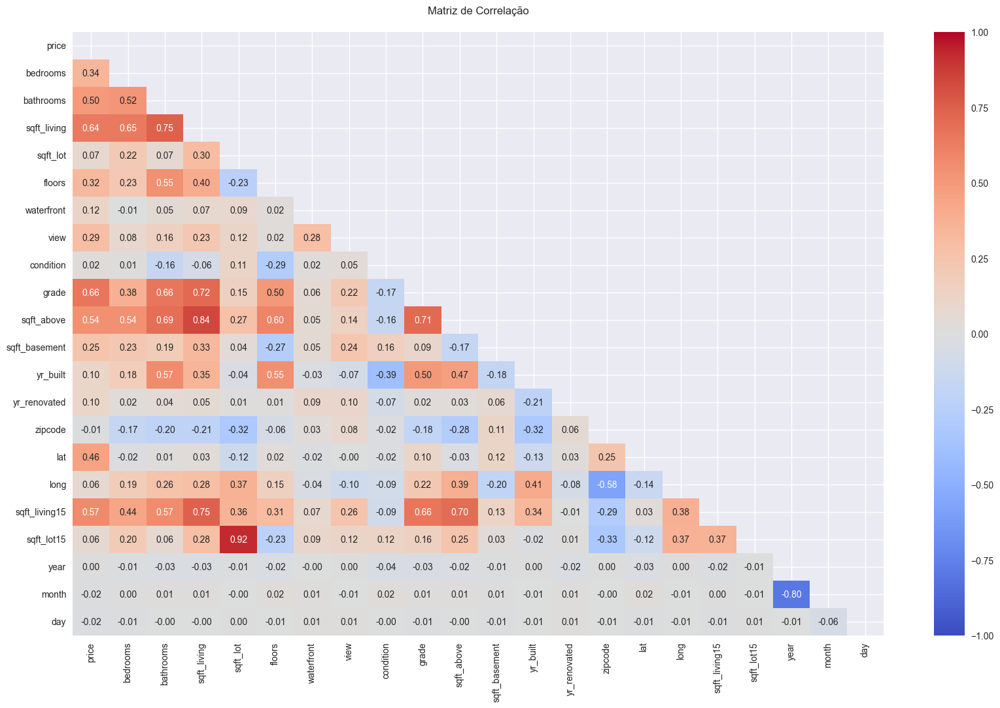

In [10]:
corr_matrix = df_sample[colunas_numericas].corr(method='spearman')
plt.figure(figsize=(20, 12))
mask = np.triu(np.ones_like(df_sample.corr(numeric_only=True), dtype=bool))
sns.heatmap(corr_matrix, 
            mask=mask,  # aplica a máscara
            vmin=-1, 
            vmax=1, 
            annot=True,  # mostra os valores
            cmap='coolwarm',  # esquema de cores
            center=0,  # centraliza o colormap em 0
            fmt='.2f')  # formato dos números (2 casas decimais)
plt.title('Matriz de Correlação', pad=20)

plt.show()

In [11]:
high_corr = corr_matrix.where(
    (np.abs(corr_matrix) > 0.7) & (corr_matrix != 1.0)
).stack()

# Ordenar correlações e remover duplicatas
high_corr = high_corr.sort_values(ascending=False)
high_corr = high_corr[~high_corr.index.duplicated()]

print("Variáveis mais correlacionadas, com valores acima de 0.7:")
print("-" * 50)
for idx, value in high_corr.items():
    print(f"{idx[0]} -> {idx[1]}: {value:.3f}")

Variáveis mais correlacionadas, com valores acima de 0.7:
--------------------------------------------------
sqft_lot -> sqft_lot15: 0.922
sqft_lot15 -> sqft_lot: 0.922
sqft_living -> sqft_above: 0.844
sqft_above -> sqft_living: 0.844
sqft_living -> sqft_living15: 0.747
sqft_living15 -> sqft_living: 0.747
bathrooms -> sqft_living: 0.746
sqft_living -> bathrooms: 0.746
sqft_living -> grade: 0.716
grade -> sqft_living: 0.716
grade -> sqft_above: 0.712
sqft_above -> grade: 0.712
year -> month: -0.804
month -> year: -0.804


<hr>

### Análise de Outliers
**Objetivo:** Identificar e analisar os outliers presentes no dataset. Os outliers são valores que estão muito distantes da média e podem influenciar a análise estatística.

In [12]:
def check_outliers(data: pd.DataFrame, features: list) -> pd.DataFrame:
    """
    Identifica e calcula a porcentagem de outliers para cada característica usando o método IQR.
    
    Parâmetros:
    - data: DataFrame com os dados
    - features: Lista de características para análise
    
    Retorna:
    - DataFrame com a porcentagem de outliers por característica
    """
    
    resultados = []
    
    for feature in features:
        # Calcula Q1, Q3 e IQR
        Q1 = data[feature].quantile(0.25)
        Q3 = data[feature].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define limites para outliers
        limite_inferior = Q1 - 1.5 * IQR
        limite_superior = Q3 + 1.5 * IQR
        
        # Conta outliers
        n_outliers = data[
            (data[feature] < limite_inferior) | 
            (data[feature] > limite_superior)
        ].shape[0]
        
        # Calcula porcentagem
        pct_outliers = (n_outliers / len(data)) * 100
        
        resultados.append({
            'caracteristica': feature,
            'total_registros': len(data),
            'n_outliers': n_outliers,
            'pct_outliers': round(pct_outliers, 2)
        })
    
    # Cria DataFrame com resultados
    df_outliers = pd.DataFrame(resultados)
    
    # Ordena por porcentagem de outliers (decrescente)
    df_outliers = df_outliers.sort_values('pct_outliers', ascending=False)
    
    return df_outliers



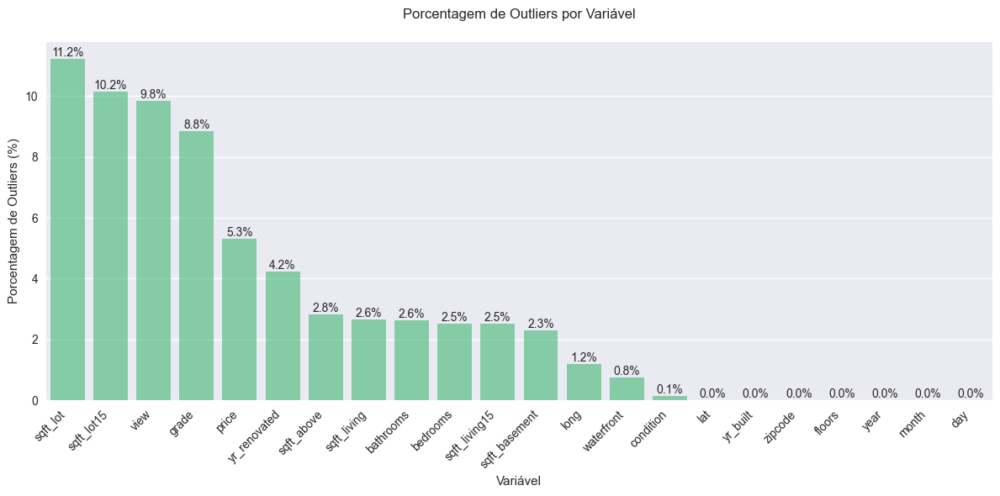

In [13]:
# Analisa outliers
df_outliers = check_outliers(df_sample, colunas_numericas)

# Visualização dos resultados
plt.figure(figsize=(12, 6))
sns.barplot(
    data=df_outliers,
    x='caracteristica',
    y='pct_outliers',
    color='#2ecc71',
    alpha=0.6
)

plt.title('Porcentagem de Outliers por Variável', pad=20)
plt.xticks(rotation=45, ha='right')
plt.xlabel('Variável')
plt.ylabel('Porcentagem de Outliers (%)')

# Adiciona valores nas barras
for i, v in enumerate(df_outliers['pct_outliers']):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')

plt.tight_layout()
plt.show()



**Comentário:** A análise de outliers é importante para entender a distribuição dos dados e identificar possíveis erros de medição ou registros incorretos. No entanto, a presença de outliers não significa necessariamente que os dados estejam errados, mas sim que eles podem ter características diferentes dos demais. Portanto, é importante analisar os outliers com cautela e considerar o contexto dos dados antes de decidir como tratá-los ou não. 

<hr>

### Análise do Preço dos imoveis por features


### Faremos a seguir uma análise ao longo do tempo

In [14]:
imoveis_data = df_sample[['year', 'month', 'price']].groupby(['year', 'month']).agg(['min','max','mean','count'])
imoveis_data

price                                
                 min        max           mean count
year month                                          
2014 5       78000.0  3710000.0  548080.276584  1768
     6       92000.0  7062500.0  558002.199541  2180
     7       86500.0  3800000.0  544788.764360  2211
     8      107000.0  5570000.0  536445.276804  1940
     9       85000.0  6885000.0  529253.821871  1774
     10      89000.0  7700000.0  539026.971778  1878
     11      82000.0  3850000.0  521961.009213  1411
     12      95000.0  3300000.0  524461.866757  1471
2015 1       99000.0  3567000.0  525870.889571   978
     2       75000.0  3065000.0  507851.371200  1250
     3       81000.0  3395000.0  543977.187200  1875
     4       84000.0  5350000.0  561837.774989  2231
     5       95000.0  4208000.0  558126.811146   646

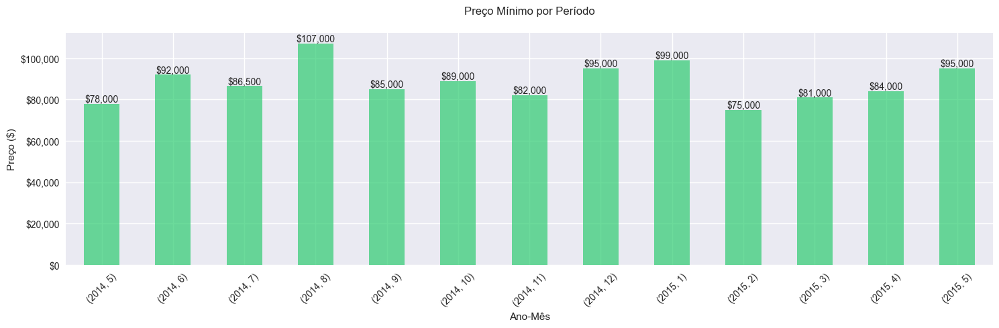

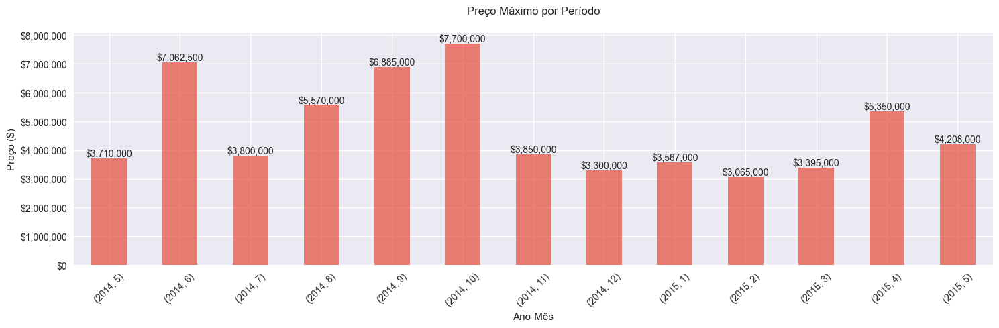

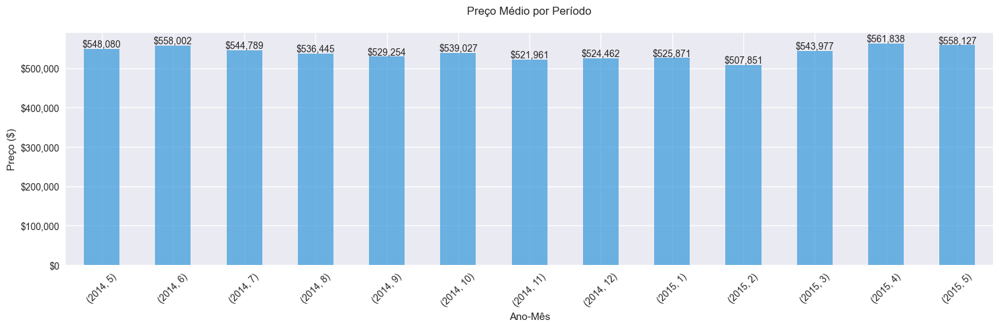

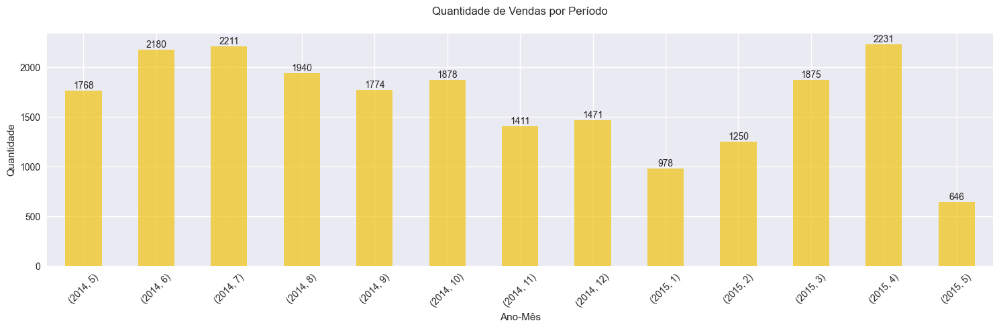

In [15]:
# Configurar o estilo
plt.style.use('seaborn')

# Cores para cada gráfico
cores = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f']

# Plot 1: Preço Mínimo
plt.figure(figsize=(15, 5))
ax1 = imoveis_data['price']['min'].plot(kind='bar', color=cores[0], alpha=0.7)
plt.title('Preço Mínimo por Período', pad=20)
plt.xlabel('Ano-Mês')
plt.ylabel('Preço ($)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Adicionar valores acima das barras
for i, v in enumerate(imoveis_data['price']['min']):
    ax1.text(i, v, f'${v:,.0f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Plot 2: Preço Máximo
plt.figure(figsize=(15, 5))
ax2 = imoveis_data['price']['max'].plot(kind='bar', color=cores[1], alpha=0.7)
plt.title('Preço Máximo por Período', pad=20)
plt.xlabel('Ano-Mês')
plt.ylabel('Preço ($)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Adicionar valores acima das barras
for i, v in enumerate(imoveis_data['price']['max']):
    ax2.text(i, v, f'${v:,.0f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Plot 3: Preço Médio
plt.figure(figsize=(15, 5))
ax3 = imoveis_data['price']['mean'].plot(kind='bar', color=cores[2], alpha=0.7)
plt.title('Preço Médio por Período', pad=20)
plt.xlabel('Ano-Mês')
plt.ylabel('Preço ($)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Adicionar valores acima das barras
for i, v in enumerate(imoveis_data['price']['mean']):
    ax3.text(i, v, f'${v:,.0f}', ha='center', va='bottom')

plt.tight_layout()
plt.show()

# Plot 4: Contagem de Vendas
plt.figure(figsize=(15, 5))
ax4 = imoveis_data['price']['count'].plot(kind='bar', color=cores[3], alpha=0.7)
plt.title('Quantidade de Vendas por Período', pad=20)
plt.xlabel('Ano-Mês')
plt.ylabel('Quantidade')
plt.xticks(rotation=45)

# Adicionar valores acima das barras
for i, v in enumerate(imoveis_data['price']['count']):
    ax4.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.show()

**Comentários:**
### Análise da Distribuição de Preços ao Longo do Tempo

#### Tendências Identificadas:

1. **Preços Mínimos**
   - Mantém-se relativamente estável entre $75,000 e $100,000
   - Não apresenta sazonalidade clara

2. **Preços Máximos**
   - Alta volatilidade
   - Picos significativos em alguns meses, ultrapassando $7M
   - Possíveis outliers ou imóveis de alto valor

3. **Preços Médios**
   - Mantém-se relativamente estável
   - Média oscila entre $500,000 e $600,000
   - Menor volatilidade comparada aos preços máximos

4. **Volume de Vendas**
   - Padrão sazonal claro
   - Picos de vendas nos meses do meio do ano
   - Quedas consistentes no fim do ano e início do ano seguinte

#### Insights Principais:
1. Mercado apresenta sazonalidade clara no volume, mas não nos preços
2. Preços médios mostram mercado equilibrado
3. Grandes variações nos preços máximos sugerem segmento tipo de imóveis de alto valor ou outliers
4. Melhor período para vendas: março a agosto, com picos em junho e julho
5. Melhor período para compras: setembro a fevereiro, com preços mais baixos

<hr>

### Análise de Preços por zipcode
**Objetivo:** Analisar a distribuição de preços dos imóveis por código postal (zipcode) para identificar áreas com preços mais altos e mais baixos.

In [16]:
zipcode_price =df_sample[['zipcode', 'price']].groupby(['zipcode']).agg(['min','max','mean','count'])
zipcode_price


price                               
              min        max          mean count
zipcode                                         
98001    100000.0   850000.0  2.808047e+05   362
98002     95000.0   389000.0  2.342840e+05   199
98003    128000.0   950000.0  2.941113e+05   280
98004    425000.0  7062500.0  1.355927e+06   317
98005    400000.0  1960000.0  8.101649e+05   168
...           ...        ...           ...   ...
98177    245560.0  3800000.0  6.761854e+05   255
98178     90000.0  1700000.0  3.106128e+05   262
98188    110000.0   707000.0  2.890783e+05   136
98198     95000.0  1350000.0  3.028789e+05   280
98199    323000.0  3200000.0  7.918208e+05   317

[70 rows x 4 columns]

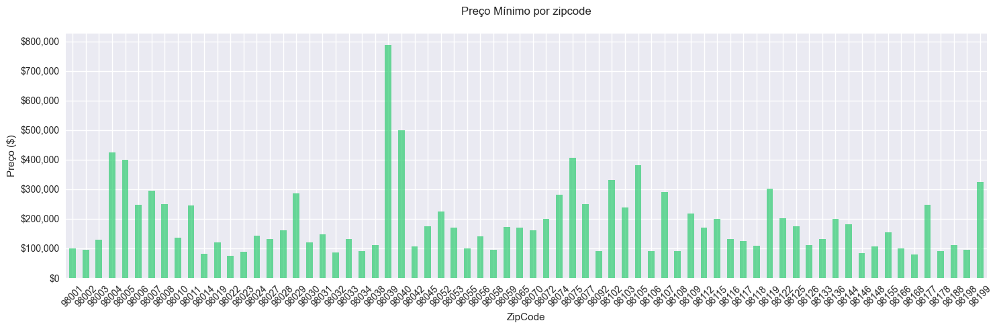

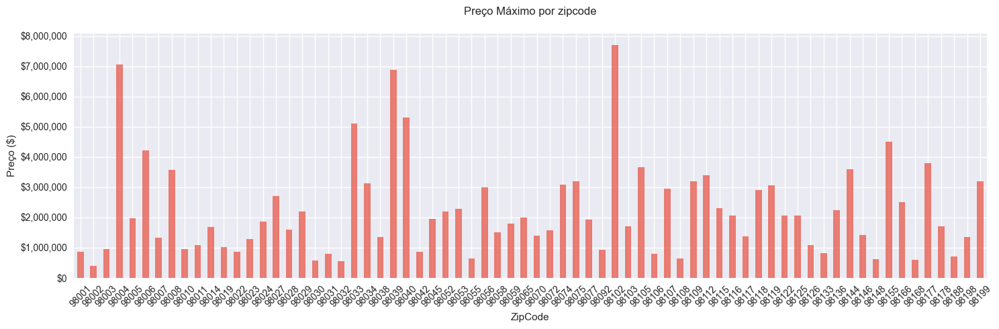

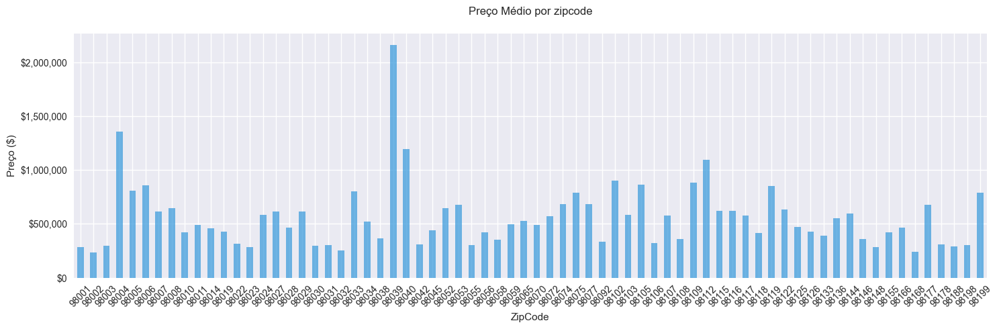

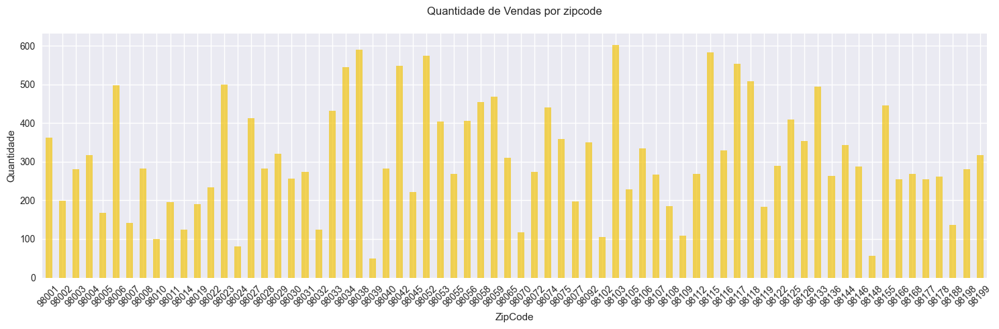

In [17]:
zipcode_price =df_sample[['zipcode', 'price']].groupby(['zipcode']).agg(['min','max','mean','count'])
# Configurar o estilo
plt.style.use('seaborn')

# Cores para cada gráfico
cores = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f']

# Plot 1: Preço Mínimo
plt.figure(figsize=(15, 5))
ax1 = zipcode_price['price']['min'].plot(kind='bar', color=cores[0], alpha=0.7)
plt.title('Preço Mínimo por zipcode', pad=20)
plt.xlabel('ZipCode')
plt.ylabel('Preço ($)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))



plt.tight_layout()
plt.show()

# Plot 2: Preço Máximo
plt.figure(figsize=(15, 5))
ax2 = zipcode_price['price']['max'].plot(kind='bar', color=cores[1], alpha=0.7)
plt.title('Preço Máximo por zipcode', pad=20)
plt.xlabel('ZipCode')
plt.ylabel('Preço ($)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))



plt.tight_layout()
plt.show()

# Plot 3: Preço Médio
plt.figure(figsize=(15, 5))
ax3 = zipcode_price['price']['mean'].plot(kind='bar', color=cores[2], alpha=0.7)
plt.title('Preço Médio por zipcode', pad=20)
plt.xlabel('ZipCode')
plt.ylabel('Preço ($)')
plt.xticks(rotation=45)
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))



plt.tight_layout()
plt.show()

# Plot 4: Contagem de Vendas
plt.figure(figsize=(15, 5))
ax4 = zipcode_price['price']['count'].plot(kind='bar', color=cores[3], alpha=0.7)
plt.title('Quantidade de Vendas por zipcode', pad=20)
plt.xlabel('ZipCode')
plt.ylabel('Quantidade')
plt.xticks(rotation=45)



plt.tight_layout()
plt.show()

**Distribuição de Preços:**
1. **Preços Mínimos**
   - Variação na faixa de $100,000 a $800,000

2. **Preços Máximos**
   - Grande disparidade entre regiões
   - Alguns Zipcodes apresentam imóveis acima de $5M

3. **Preços Médios**
   - Faixa predominante: $400,000 a $1M

4. **Volume de Vendas**
   - Distribuição desigual entre Zipcodes
   - Alguns Zipcodes concentram +200 vendas
   - Os Zipcodes com maior volume de vendas possuem a menor média e máxima de preços

**Comentário:**
Forte segmentação geográfica do mercado, com Zipcodes específicos dominando diferentes faixas de preço, indicando clara estratificação do mercado imobiliário por região.

<hr>

### Análise da Distribuição Quartos x Banheiros

**Objetivo**: 
Visualizar a relação entre número de quartos, banheiros e o valor acumulado dos imóveis através de um mapa de calor bidimensional.

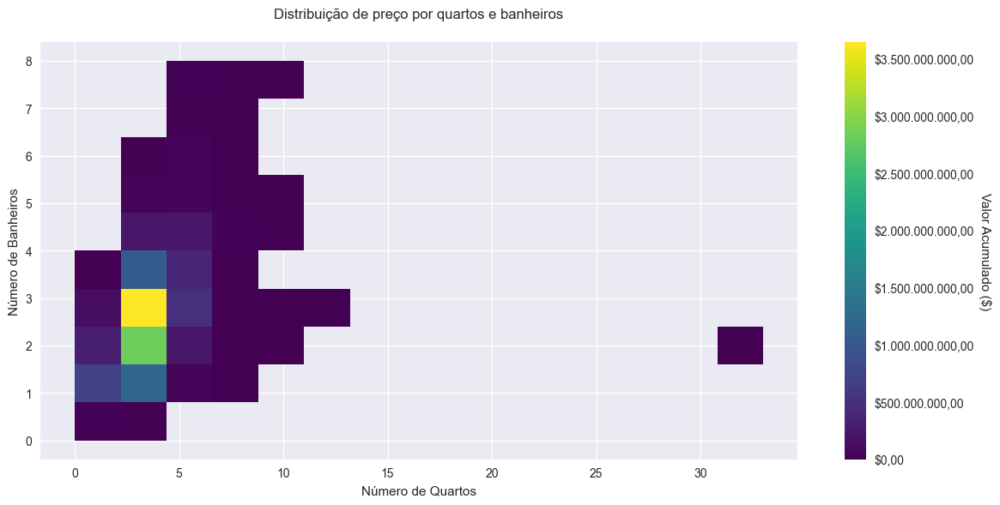

In [ ]:
# Cria uma figura com dimensões 12x6
plt.figure(figsize=(12, 6))

# Cria um histograma 2D usando seaborn
# - data: utiliza a amostra do DataFrame
# - x: número de quartos no eixo x
# - y: número de banheiros no eixo y
# - weights: usa o preço como peso para cada combinação
# - cmap: esquema de cores 'viridis'
# - bins: define 15 divisões para quartos e 10 para banheiros
hist = sns.histplot(
    data=df_sample,
    x='bedrooms',
    y='bathrooms',
    weights='price',
    cmap='viridis',
    bins=(15, 10)
)

# Configura título e rótulos dos eixos
plt.title('Distribuição de preço por quartos e banheiros', pad=20)
plt.xlabel('Número de Quartos')
plt.ylabel('Número de Banheiros')

# Adiciona e configura a barra de cores
colorbar = plt.colorbar(hist.collections[0])
colorbar.set_label('Valor Acumulado ($)', rotation=270, labelpad=15)

# Formata os valores da barra de cores para moeda
colorbar.formatter.set_scientific(False)
colorbar.formatter = plt.FuncFormatter(lambda x, p: f'${x:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))
colorbar.update_ticks()

# Ajusta o layout e exibe o gráfico
plt.tight_layout()
plt.show()



**Análise dos Resultados**
1. **Concentração**
   - Maior concentração de valor: 3-5 quartos com 2-3banheiros
   - Imóveis com mais de 10 quartos são raros e representam menor valor acumulado

2. **Padrão de Mercado**
   - Valores mais altos concentrados na faixa 3-5 quartos

3. **Outliers**
   - Poucos imóveis com mais de 10 quartos ou 4 banheiros
   - Combinações extremas representam menor valor total no mercado

 <hr>

 ### Análise da Relação Área Construída x Área do Terreno

 **Objetivo**
Visualizar a distribuição do valor acumulado dos imóveis em relação à área construída e área total do terreno, identificando padrões de concentração de valor no mercado.



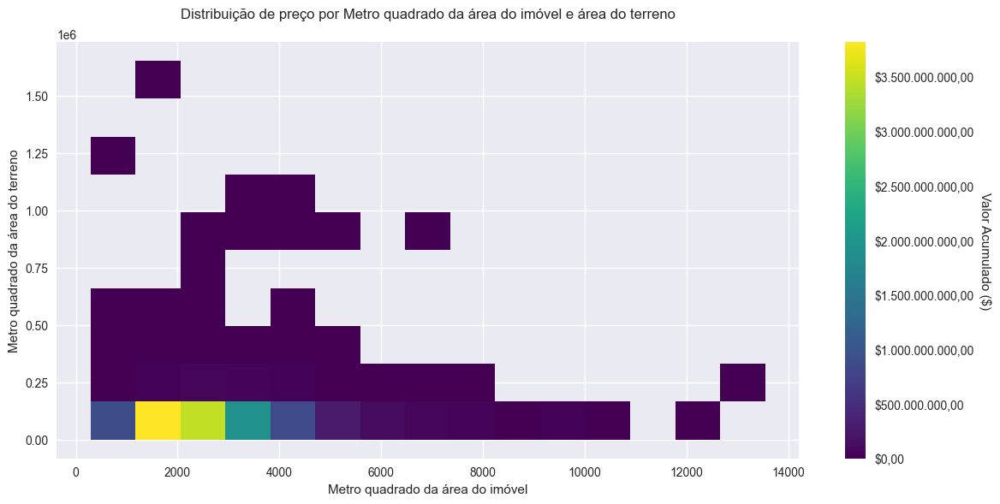

In [ ]:
# Define o tamanho da figura
plt.figure(figsize=(12, 6))

# Cria um histograma 2D usando seaborn
# - data: usa a amostra do DataFrame
# - x: área construída do imóvel
# - y: área total do terreno
# - weights: usa o preço como peso para cada combinação
# - cmap: esquema de cores 'viridis'
# - bins: define 15 divisões para área construída e 10 para área do terreno
hist = sns.histplot(
    data=df_sample,
    x='sqft_living',
    y='sqft_lot',
    weights='price',
    cmap='viridis',
    bins=(15, 10)
)

# Configura título e rótulos dos eixos
plt.title('Distribuição de preço por Metro quadrado da área do imóvel e área do terreno', pad=20)
plt.xlabel('Metro quadrado da área do imóvel')
plt.ylabel('Metro quadrado da área do terreno')

# Adiciona e configura a barra de cores
colorbar = plt.colorbar(hist.collections[0])
colorbar.set_label('Valor Acumulado ($)', rotation=270, labelpad=15)

# Formata os valores da barra de cores para moeda brasileira
colorbar.formatter.set_scientific(False)
colorbar.formatter = plt.FuncFormatter(lambda x, p: f'${x:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))
colorbar.update_ticks()

# Ajusta o layout e exibe o gráfico
plt.tight_layout()
plt.show()


 **Análise dos Resultados**
1. **Concentração de Valor**
   - Maior concentração de valor em imóveis com área construída entre 1500-3000 sqft
   - Terrenos até 10000 sqft concentram maior valor total

2. **Padrões de Mercado**
   - Imóveis grandes em terrenos e pequenos na área construída têm maior valor acumulado
   - Baixa concentração de valor em terrenos muito grandes
   
3. **Distribuição**
   - Relação não linear entre tamanho do terreno e valor
   - Área construída tem maior influência no valor que área do terreno

<hr>

### Análise da Distribuição Área Acima x Abaixo do Solo

 **Objetivo**
Analisar a relação entre as áreas construídas acima do solo (andares) e abaixo do solo (porão) e sua influência no valor acumulado dos imóveis.

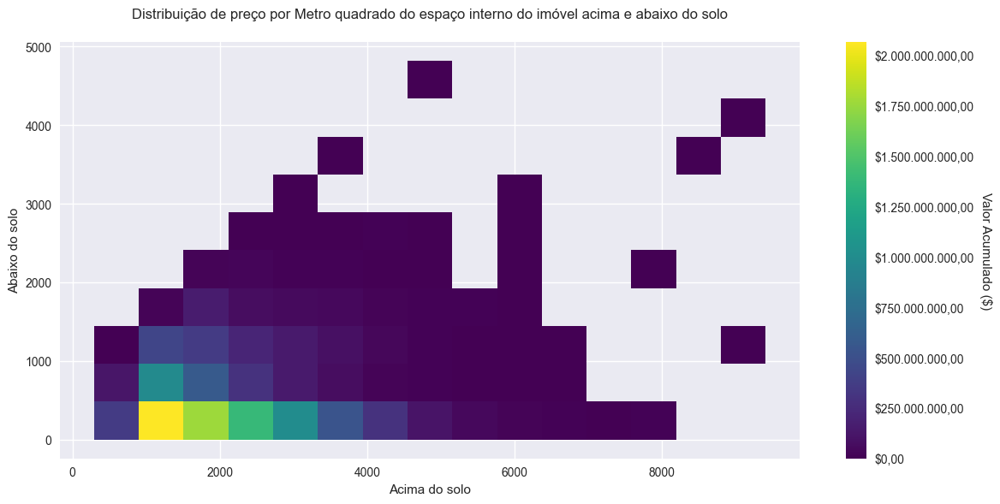

In [ ]:
# Define o tamanho da figura
plt.figure(figsize=(12, 6))

# Cria um histograma 2D usando seaborn
# - data: usa a amostra do DataFrame
# - x: área construída acima do solo
# - y: área do porão (abaixo do solo)
# - weights: usa o preço como peso para cada combinação
# - cmap: esquema de cores 'viridis'
# - bins: define 15 divisões para área acima e 10 para área abaixo
hist = sns.histplot(
    data=df_sample,
    x='sqft_above',
    y='sqft_basement',
    weights='price',
    cmap='viridis',
    bins=(15, 10)
)

# Configura título e rótulos dos eixos
plt.title('Distribuição de preço por Metro quadrado do espaço interno do imóvel acima e abaixo do solo', pad=20)
plt.xlabel('Acima do solo')
plt.ylabel('Abaixo do solo')

# Adiciona e configura a barra de cores
colorbar = plt.colorbar(hist.collections[0])
colorbar.set_label('Valor Acumulado ($)', rotation=270, labelpad=15)

# Formata os valores da barra de cores para moeda
colorbar.formatter.set_scientific(False)
colorbar.formatter = plt.FuncFormatter(lambda x, p: f'${x:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))
colorbar.update_ticks()

# Ajusta o layout e exibe o gráfico
plt.tight_layout()
plt.show()


**Análise dos Resultados**
1. **Distribuição de Valor**
   - Maior concentração de valor em imóveis com área maior acima do solo
   - Porões (área abaixo do solo) tendem a ser menores que a área superior

2. **Padrões Construtivos**
   - Maior acumulo dos valores dos imóveis em área superior entre 1000 até 4000 sqft
   - Porões possuem poucas ocorrencias acima de 2000 sqft
   
3. **Tendência de Mercado**
   - Preferência por área habitável acima do solo
   - Porões não representam grande valor agregado

<hr>

### Análise da Vizinhança - Área Construída x Área do Terreno

**Objetivo**
Analisar como as características dos imóveis vizinhos (área construída e área do terreno) se relacionam com o valor dos imóveis, considerando os 15 vizinhos mais próximos.



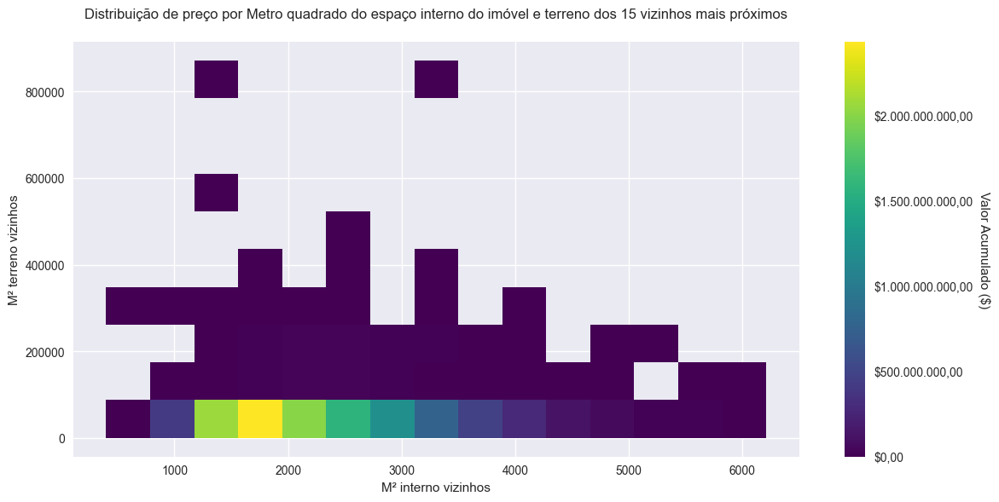

In [ ]:
# Define o tamanho da figura
plt.figure(figsize=(12, 6))

# Cria um histograma 2D usando seaborn
# - data: usa a amostra do DataFrame
# - x: área interna dos vizinhos
# - y: área do terreno dos vizinhos
# - weights: usa o preço como peso
# - cmap: esquema de cores 'viridis'
# - bins: define divisões para as áreas
hist = sns.histplot(
    data=df_sample,
    x='sqft_living15',
    y='sqft_lot15',
    weights='price',
    cmap='viridis',
    bins=(15, 10)
)

# Configura título e rótulos
plt.title('Distribuição de preço por Metro quadrado do espaço interno do imóvel e terreno dos 15 vizinhos mais próximos', pad=20)
plt.xlabel('M² interno vizinhos')
plt.ylabel('M² terreno vizinhos')

# Adiciona e configura barra de cores
colorbar = plt.colorbar(hist.collections[0])
colorbar.set_label('Valor Acumulado ($)', rotation=270, labelpad=15)

# Formata valores da barra de cores
colorbar.formatter.set_scientific(False)
colorbar.formatter = plt.FuncFormatter(lambda x, p: f'${x:,.2f}'.replace(',', 'X').replace('.', ',').replace('X', '.'))
colorbar.update_ticks()

plt.tight_layout()
plt.show()


**Análise dos Resultados**
1. **Padrão de Vizinhança**
   - Concentração de valor em áreas onde vizinhos têm imóveis de tamanho interno até 3500 sqft
   - Terrenos com área até 10000 sqft são mais comuns
   - Maior homogeneidade nas áreas construídas que nas áreas de terreno

2. **Influência no Valor**
   - Terrenos muito discrepantes da média local são menos comuns



<hr> 

### Análise de Preços por Número de Andares

 **Objetivo**
Visualizar e analisar a relação entre o número de andares dos imóveis e seus preços, através de quatro perspectivas diferentes: preços mínimos, máximos, médios e quantidade de imóveis.

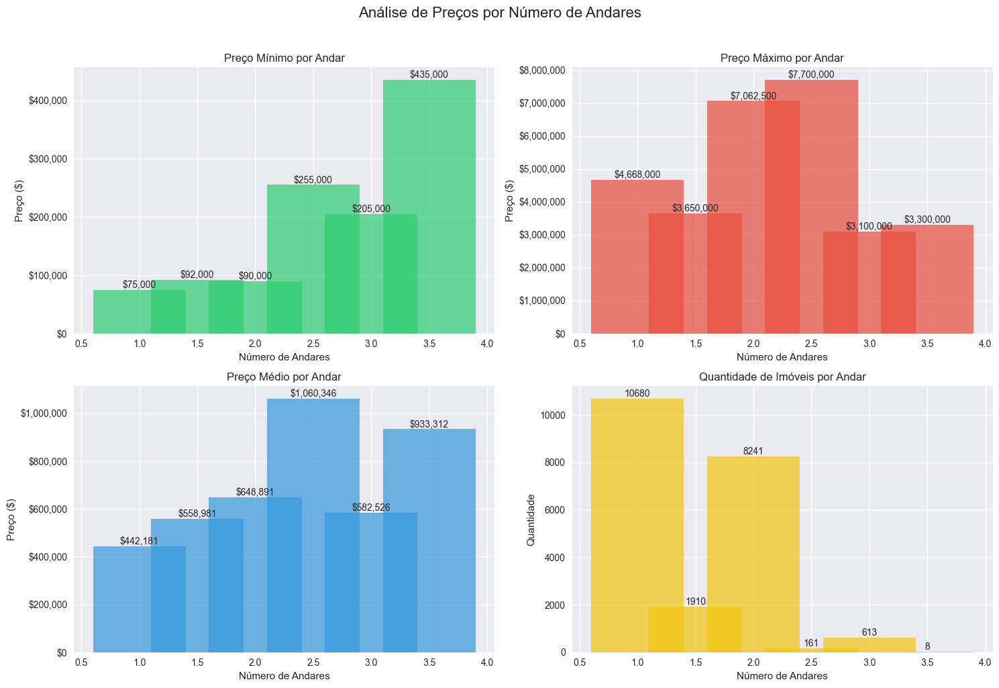

In [24]:
# Preparar os dados
floor_stats = df_sample[['floors', 'price']].groupby(['floors']).agg(['min', 'max', 'mean', 'count'])

# Configurar o estilo
plt.style.use('seaborn')
cores = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f']  # Verde, Vermelho, Azul, Amarelo

# Criar subplots
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Análise de Preços por Número de Andares', fontsize=16, y=1.02)

# Plot 1: Preço Mínimo
axes[0, 0].bar(floor_stats.index, floor_stats['price']['min'], color=cores[0], alpha=0.7)
axes[0, 0].set_title('Preço Mínimo por Andar')
axes[0, 0].set_ylabel('Preço ($)')
axes[0, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Plot 2: Preço Máximo
axes[0, 1].bar(floor_stats.index, floor_stats['price']['max'], color=cores[1], alpha=0.7)
axes[0, 1].set_title('Preço Máximo por Andar')
axes[0, 1].set_ylabel('Preço ($)')
axes[0, 1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Plot 3: Preço Médio
axes[1, 0].bar(floor_stats.index, floor_stats['price']['mean'], color=cores[2], alpha=0.7)
axes[1, 0].set_title('Preço Médio por Andar')
axes[1, 0].set_ylabel('Preço ($)')
axes[1, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Plot 4: Contagem de Imóveis
axes[1, 1].bar(floor_stats.index, floor_stats['price']['count'], color=cores[3], alpha=0.7)
axes[1, 1].set_title('Quantidade de Imóveis por Andar')
axes[1, 1].set_ylabel('Quantidade')

# Adicionar valores nas barras e ajustar eixos para todos os subplots
for ax in axes.flat:
    ax.set_xlabel('Número de Andares')
    for i, v in enumerate(ax.containers[0]):
        height = v.get_height()
        if 'Quantidade' in ax.get_ylabel():
            ax.text(v.get_x() + v.get_width()/2, height, f'{int(height)}',
                   ha='center', va='bottom')
        else:
            ax.text(v.get_x() + v.get_width()/2, height, f'${height:,.0f}',
                   ha='center', va='bottom')

plt.tight_layout()
plt.show()

 **Análise dos Resultados**

1. **Distribuição de Imóveis**
   - Predominância de casas com 1 e 2 andares no mercado
   - Imóveis com 3 andares são menos comuns
   - Raros casos de imóveis com mais de 3 andares

2. **Análise de Preços**
   - **Preços Mínimos**: Tendência de aumento com o número de andares
   - **Preços Máximos**: Picos significativos em imóveis com 2 e 3 andares
   - **Preços Médios**: Correlação positiva entre número de andares e preço médio

3. **Insights Principais**
   - Mercado concentrado em casas de 1-2 andares
   - Imóveis com mais andares tendem a ter valores mais elevados
   - Maior variabilidade de preços em imóveis com 2 andares

<hr>

### Análise de Preços por Vista para Água (Waterfront)

**Objetivo**
Analisar a diferença de preços entre imóveis com e sem vista para água, considerando preços mínimos, máximos e médios.

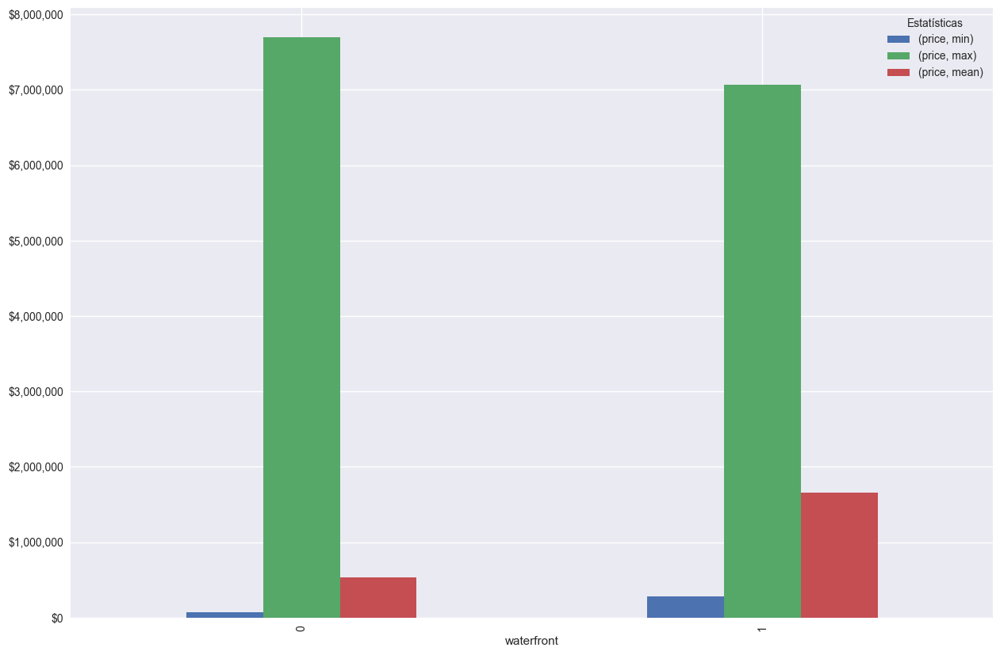

price                         
                 min        max          mean
waterfront                                   
0            75000.0  7700000.0  5.315636e+05
1           285000.0  7062500.0  1.661876e+06

In [37]:
# Cria um gráfico de barras agrupadas para análise de preços por vista para água
ax = df_sample[['waterfront', 'price']].groupby(['waterfront']).agg(['min','max','mean']).plot(
    kind='bar',      # Tipo do gráfico: barras
    subplots=False,  # Todas as métricas no mesmo gráfico
    figsize=(15, 10) # Tamanho da figura
)

# Formata o eixo Y para mostrar valores em dólares
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Adiciona legenda
plt.legend(title='Estatísticas')

# Exibe o gráfico
plt.show()

# Exibe tabela com os valores numéricos
df_sample[['waterfront', 'price']].groupby(['waterfront']).agg(['min','max','mean'])

**Análise dos Resultados**

1. **Valorização**
   - Imóveis com vista para água (waterfront=1) apresentam valores significativamente mais altos
   - A diferença de preço médio é substancial entre as duas categorias

2. **Amplitude de Preços**
   - Maior variação de preços em imóveis com vista para água
   - Preço mínimo de imóveis com vista para água é superior ao preço mínimo dos sem vista, assim como a média

3. **Insights de Mercado**
   - Vista para água é um forte diferencial de valorização
   - Menor quantidade de imóveis disponíveis com esta característica

<hr>

### Análise de Preços por Ano de Construção

#### Objetivo
Analisar a evolução histórica dos preços dos imóveis através de quatro métricas principais: preços mínimos, máximos, médios e quantidade de imóveis por ano de construção. Esta análise visa identificar tendências temporais e padrões no mercado imobiliário.


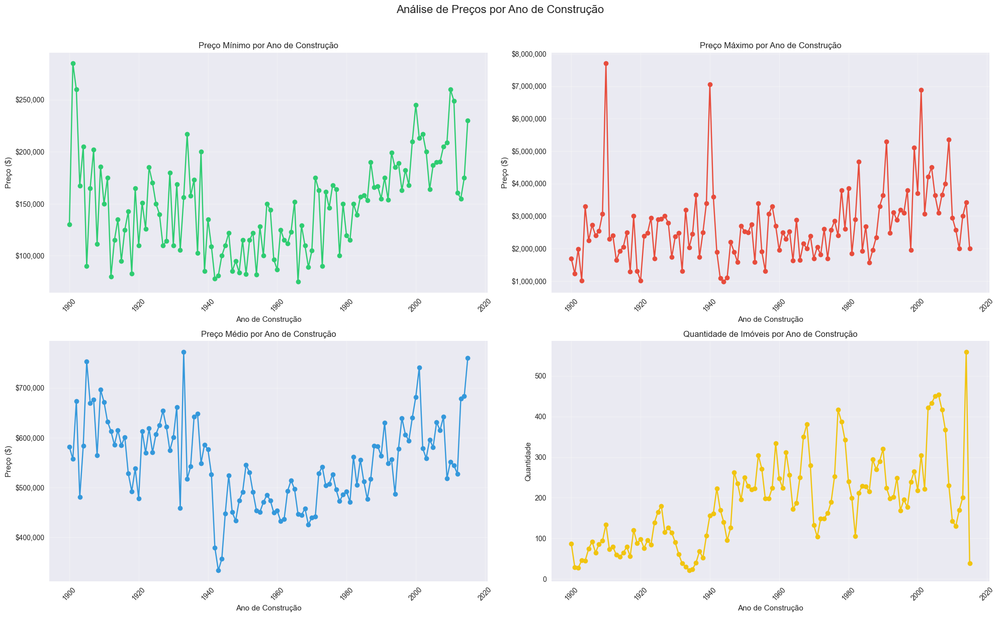

In [26]:
# Preparar os dados
year_stats = df_sample[['yr_built', 'price']].groupby(['yr_built']).agg(['min', 'max', 'mean', 'count'])

# Configurar o estilo
plt.style.use('seaborn')
cores = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f']  # Verde, Vermelho, Azul, Amarelo

# Criar subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('Análise de Preços por Ano de Construção', fontsize=16, y=1.02)

# Plot 1: Preço Mínimo
axes[0, 0].plot(year_stats.index, year_stats['price']['min'], color=cores[0], marker='o')
axes[0, 0].set_title('Preço Mínimo por Ano de Construção')
axes[0, 0].set_ylabel('Preço ($)')
axes[0, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Preço Máximo
axes[0, 1].plot(year_stats.index, year_stats['price']['max'], color=cores[1], marker='o')
axes[0, 1].set_title('Preço Máximo por Ano de Construção')
axes[0, 1].set_ylabel('Preço ($)')
axes[0, 1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Preço Médio
axes[1, 0].plot(year_stats.index, year_stats['price']['mean'], color=cores[2], marker='o')
axes[1, 0].set_title('Preço Médio por Ano de Construção')
axes[1, 0].set_ylabel('Preço ($)')
axes[1, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
axes[1, 0].grid(True, alpha=0.3)

# Plot 4: Contagem de Imóveis
axes[1, 1].plot(year_stats.index, year_stats['price']['count'], color=cores[3], marker='o')
axes[1, 1].set_title('Quantidade de Imóveis por Ano de Construção')
axes[1, 1].set_ylabel('Quantidade')
axes[1, 1].grid(True, alpha=0.3)

# Ajustar eixos x para todos os subplots
for ax in axes.flat:
    ax.set_xlabel('Ano de Construção')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


**Análise dos Resultados**

1. **Preços Mínimos**
   - Tendência de aumento gradual ao longo dos anos
   - Imóveis mais antigos tendem a ter preços mínimos mais baixos
   - Maior volatilidade em construções recentes

2. **Preços Máximos**
   - Picos significativos em períodos específicos
   - Imóveis construídos após 2000 apresentam valores máximos mais elevados
   - Grande variabilidade, podendo indicar outros fatores além da idade do imóvel

3. **Preços Médios**
   - Tendência geral de valorização para construções mais recentes
   - Aumento mais acentuado a partir dos anos 1990
   - Correlação positiva entre modernidade e valor médio

4. **Distribuição Temporal**
   - Maior concentração de imóveis construídos entre 1960-2000
   - Pico de construções nos anos 1990

5. **Insights Gerais**
   - Idade do imóvel é um fator relevante na precificação
   - Construções modernas tendem a ter valores mais elevados
   - Mercado mostra preferência por imóveis mais novos
   - Possível influência de reformas e atualizações não considerada nesta análise

<hr>

### Análise de Preços por Ano de Renovação

**Objetivo**
Analisar o impacto das renovações nos preços dos imóveis ao longo do tempo, considerando preços mínimos, máximos, médios e quantidade de imóveis renovados por ano.

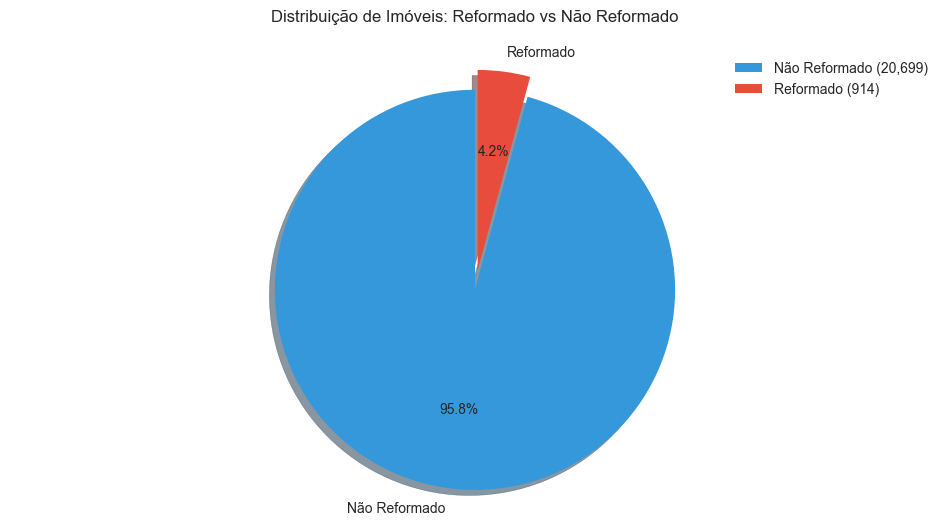

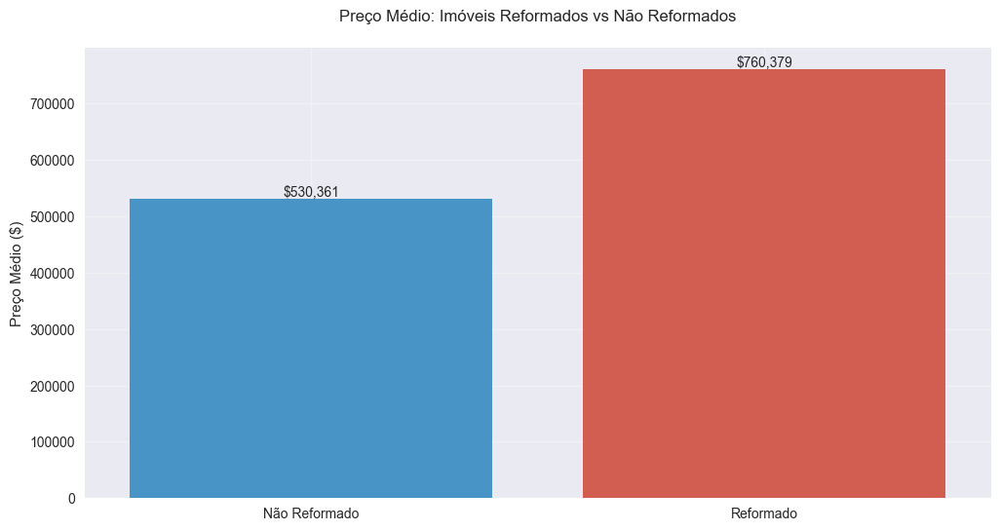

In [28]:
# Preparar os dados
renovated_counts = pd.Series({
    'Não Reformado': df_sample[df_sample['yr_renovated'] == 0].shape[0],
    'Reformado': df_sample[df_sample['yr_renovated'] != 0].shape[0]
})

# Criar figura
plt.figure(figsize=(12, 6))

# Criar gráfico de pizza
plt.pie(renovated_counts, 
        labels=renovated_counts.index,
        autopct='%1.1f%%',
        colors=['#3498db', '#e74c3c'],
        explode=(0.05, 0.05),
        shadow=True,
        startangle=90)

plt.title('Distribuição de Imóveis: Reformado vs Não Reformado', pad=20)

# Adicionar legenda com valores absolutos
plt.legend(labels=[f'{label} ({value:,})' 
                  for label, value in renovated_counts.items()],
          loc='best')

plt.axis('equal')
plt.show()

#Gráfico de Barras com Preço Médio
plt.figure(figsize=(12, 6))
avg_price = df_sample.groupby(df_sample['yr_renovated'] > 0)['price'].mean()

sns.barplot(
    x=['Não Reformado', 'Reformado'],
    y=avg_price,
    palette=['#3498db', '#e74c3c']
)

# Adicionar valores nas barras
for i, v in enumerate(avg_price):
    plt.text(i, v, f'${v:,.0f}', ha='center', va='bottom')

plt.title('Preço Médio: Imóveis Reformados vs Não Reformados', pad=20)
plt.ylabel('Preço Médio ($)')
plt.grid(True, alpha=0.3)

plt.show()


**Comentário**: imóveis reformados representam uma parcela pequena do dataset, mas apresentam uma média de preço mais alta. Iremos fazer a seguir uma análise mais detalhada dos imóveis reformados. Essa análise pode ajudar a entender melhor o impacto das reformas no valor dos imóveis e identificar tendências de mercado relacionados a essa característica.

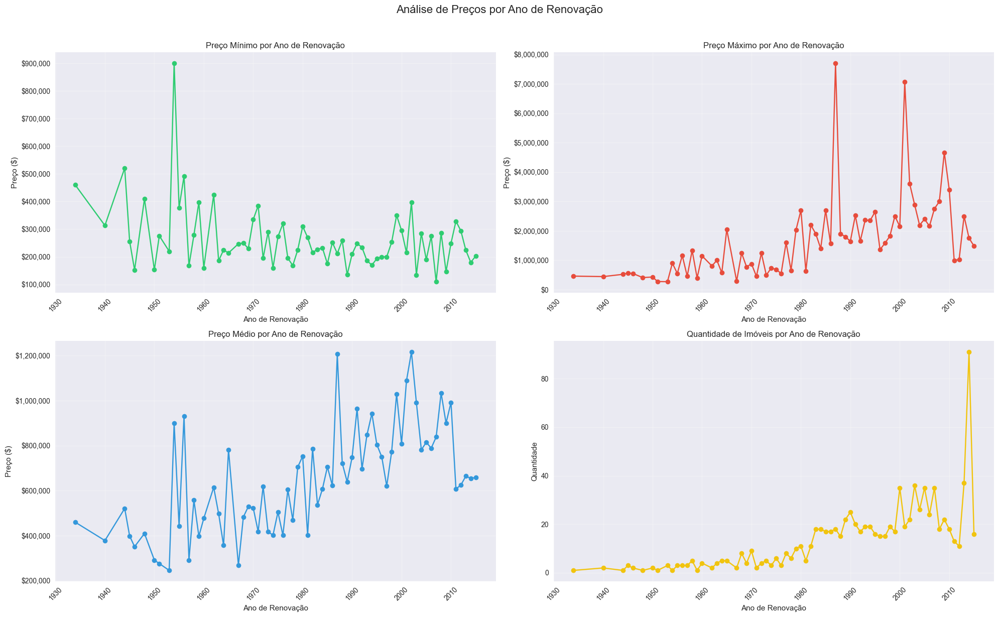

In [29]:
# Preparar os dados
year_stats = df_sample[['yr_renovated', 'price']].groupby(['yr_renovated']).agg(['min', 'max', 'mean', 'count']).drop(0)

# Configurar o estilo
plt.style.use('seaborn')
cores = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f']  # Verde, Vermelho, Azul, Amarelo

# Criar subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 12))
fig.suptitle('Análise de Preços por Ano de Renovação', fontsize=16, y=1.02)

# Plot 1: Preço Mínimo
axes[0, 0].plot(year_stats.index, year_stats['price']['min'], color=cores[0], marker='o')
axes[0, 0].set_title('Preço Mínimo por Ano de Renovação')
axes[0, 0].set_ylabel('Preço ($)')
axes[0, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
axes[0, 0].grid(True, alpha=0.3)

# Plot 2: Preço Máximo
axes[0, 1].plot(year_stats.index, year_stats['price']['max'], color=cores[1], marker='o')
axes[0, 1].set_title('Preço Máximo por Ano de Renovação')
axes[0, 1].set_ylabel('Preço ($)')
axes[0, 1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
axes[0, 1].grid(True, alpha=0.3)

# Plot 3: Preço Médio
axes[1, 0].plot(year_stats.index, year_stats['price']['mean'], color=cores[2], marker='o')
axes[1, 0].set_title('Preço Médio por Ano de Renovação')
axes[1, 0].set_ylabel('Preço ($)')
axes[1, 0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))
axes[1, 0].grid(True, alpha=0.3)

# Plot 4: Contagem de Imóveis
axes[1, 1].plot(year_stats.index, year_stats['price']['count'], color=cores[3], marker='o')
axes[1, 1].set_title('Quantidade de Imóveis por Ano de Renovação')
axes[1, 1].set_ylabel('Quantidade')
axes[1, 1].grid(True, alpha=0.3)

# Ajustar eixos x para todos os subplots
for ax in axes.flat:
    ax.set_xlabel('Ano de Renovação')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


**Análise dos Resultados**

1. **Preços Mínimos**
   - Tendencia estável ao longo do tempo.   

2. **Preços Máximos**
   - Tendencia crerscente, com picos em anos específicos
   - Grande amplitude entre valores máximos, podendo indicar forte influência de outros fatores
   - Renovações recentes tendem a atingir valores mais expressivos

3. **Preços Médios**
   - Correlação positiva entre ano de renovação e preço médio
   - Renovações mais recentes resultam em valores médios mais elevados
   - Tendência crescente ao longo das décadas

4. **Frequência de Renovações**
   - Concentração maior de renovações nos últimos 20-30 anos
   - Número reduzido de registros de renovações antigas
   - Picos de renovação em períodos específicos

5. **Insights Principais**
   - Renovações são um fator significativo na valorização dos imóveis
   - Modernização recente tem maior impacto no valor final
   - Mercado valoriza mais imóveis com reformas recentes
   - Investimento em renovação de imóveis pode ser uma estratégia efetiva para valorização

<hr>

### Análise de Características Qualitativas dos Imóveis

**Objetivo**
Analisar a relação entre as características qualitativas dos imóveis (view, condition e grade) e seus preços, através de diferentes perspectivas estatísticas e visuais. O estudo visa identificar padrões e correlações que influenciam a precificação dos imóveis.

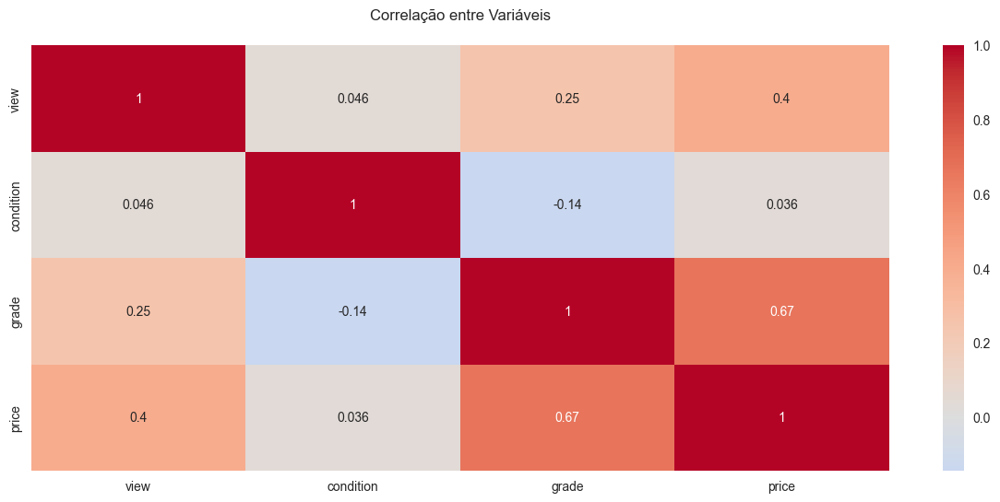

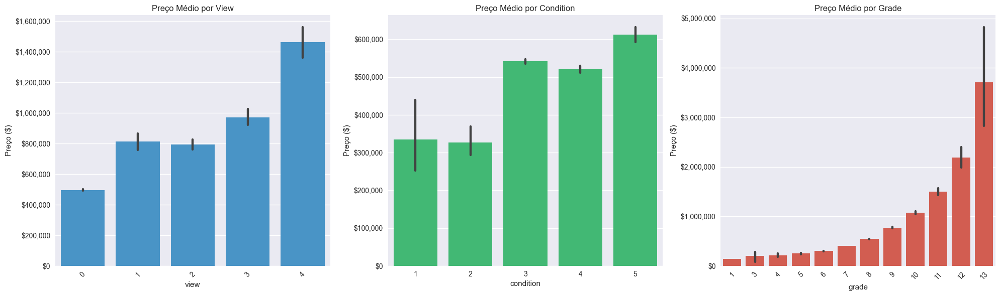

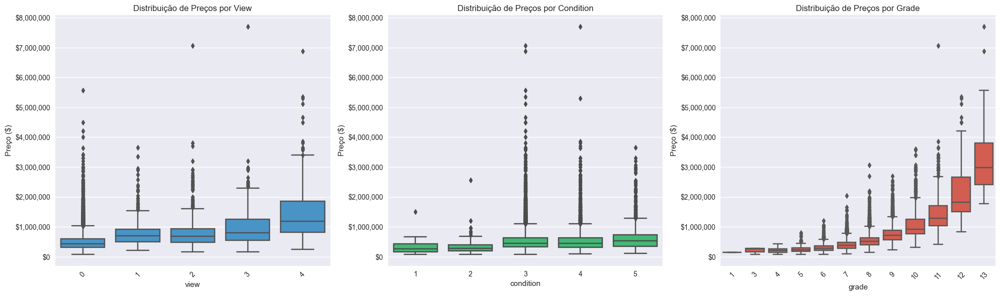


Top 10 combinações mais caras (preço médio):


count        mean     median         std        min  \
view condition grade                                                        
3    4         13         1  7700000.00  7700000.0         NaN  7700000.0   
4    3         13         3  4524333.33  3800000.0  2094635.13  2888000.0   
2    4         13         1  3800000.00  3800000.0         NaN  3800000.0   
4    4         12         5  3321100.00  3100000.0  1183678.50  2125000.0   
1    3         12         2  3200000.00  3200000.0   636396.10  2750000.0   
0    3         13         5  3073800.00  2479000.0  1484344.03  1780000.0   
3    3         13         1  2983000.00  2983000.0         NaN  2983000.0   
4    4         11         7  2877112.86  3300000.0   991896.61  1350000.0   
     3         12        16  2833003.12  2390000.0  1367815.85   900000.0   
2    4         12         3  2730000.00  2725000.0   977509.59  1755000.0   

                            max  
view condition grade             
3    4         13     7700000.0  
4    3         13     6885000.0  
2    4         13     3800000.0  
4    4         12     5300000.0  
1    3         12     3650000.0  
0    3         13     5570000.0  
3    3         13     2983000.0  
4    4         11     3850000.0  
     3         12     5350000.0  
2    4         12     3710000.0

In [31]:
# 1. Análise de correlação entre as variáveis
plt.figure(figsize=(15, 6))

# Heatmap de correlação
correlation = df_sample[['view', 'condition', 'grade', 'price']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', center=0)
plt.title('Correlação entre Variáveis', pad=20)
plt.show()

# 2. Análise de preço médio por característica
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Preço médio por view
sns.barplot(data=df_sample, x='view', y='price', ax=axes[0], color='#3498db')
axes[0].set_title('Preço Médio por View')
axes[0].set_ylabel('Preço ($)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Preço médio por condition
sns.barplot(data=df_sample, x='condition', y='price', ax=axes[1], color='#2ecc71')
axes[1].set_title('Preço Médio por Condition')
axes[1].set_ylabel('Preço ($)')
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Preço médio por grade
sns.barplot(data=df_sample, x='grade', y='price', ax=axes[2], color='#e74c3c')
axes[2].set_title('Preço Médio por Grade')
axes[2].set_ylabel('Preço ($)')
axes[2].tick_params(axis='x', rotation=45)
axes[2].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

plt.tight_layout()
plt.show()

# 3. Box plots para análise da distribuição de preços
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# Box plot por view
sns.boxplot(data=df_sample, x='view', y='price', ax=axes[0], color='#3498db')
axes[0].set_title('Distribuição de Preços por View')
axes[0].set_ylabel('Preço ($)')
axes[0].tick_params(axis='x', rotation=45)
axes[0].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Box plot por condition
sns.boxplot(data=df_sample, x='condition', y='price', ax=axes[1], color='#2ecc71')
axes[1].set_title('Distribuição de Preços por Condition')
axes[1].set_ylabel('Preço ($)')
axes[1].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

# Box plot por grade
sns.boxplot(data=df_sample, x='grade', y='price', ax=axes[2], color='#e74c3c')
axes[2].set_title('Distribuição de Preços por Grade')
axes[2].set_ylabel('Preço ($)')
axes[2].tick_params(axis='x', rotation=45)
axes[2].yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'${x:,.0f}'))

plt.tight_layout()
plt.show()

# 4. Análise estatística
stats_df = df_sample.groupby(['view', 'condition', 'grade'])['price'].agg([
    'count',
    'mean',
    'median',
    'std',
    'min',
    'max'
]).round(2)

print("\nTop 10 combinações mais caras (preço médio):")
stats_df.sort_values('mean', ascending=False).head(10)



In [32]:
print("\nTop 10 combinações mais frequentes:")
stats_df.sort_values('count', ascending=False).head(10)


Top 10 combinações mais frequentes:


count       mean    median        std       min  \
view condition grade                                                    
0    3         7       5019  380336.13  354000.0  137650.49   90000.0   
               8       3900  492173.15  473487.5  167394.82  140000.0   
     4         7       2673  405571.28  383000.0  156211.76  115000.0   
     3         9       1752  701769.59  675000.0  247649.20  230000.0   
     4         8       1183  560127.59  549900.0  210839.13  149900.0   
     3         6       1008  287944.85  264950.0  110710.42   82000.0   
     5         7        786  473576.59  449950.0  170381.92  161500.0   
     3         10       731  949385.76  855000.0  359911.48  316000.0   
     4         6        649  310245.20  289500.0  119813.78   89000.0   
               9        321  825838.35  778000.0  329788.93  260000.0   

                            max  
view condition grade             
0    3         7      1545000.0  
               8      2150000.0  
     4         7      1398000.0  
     3         9      2300000.0  
     4         8      1555000.0  
     3         6      1050000.0  
     5         7      1150000.0  
     3         10     3000000.0  
     4         6      1052000.0  
               9      2271150.0


**Análise dos Resultados**

1. **Correlações (Heatmap)**
   - Forte correlação positiva entre `grade` e `price` (maior influência)
   - Correlação moderada entre `view` e `price`
   - Correlação fraca entre `condition` e `price`
   - Baixa correlação entre as variáveis qualitativas entre si

2. **Análise por View (Vista)**
   - Imóveis com melhores vistas (4-5) apresentam preços significativamente mais altos
   - Grande variabilidade de preços em vistas superiores
   - Vista é um fator de valorização importante, especialmente nas categorias mais altas

3. **Análise por Condition (Condição)**
   - Condições 1-2 apresentam preços mais baixos
   - Condições 3-4 apresentam preços médios mais altos
   - Aumento gradual do preço médio com a melhoria da condição
   - Maior dispersão de preços em condições intermediárias (3-4)

4. **Análise por Grade (Qualidade)**
   - Impacto mais significativo no preço entre todas as características
   - Crescimento exponencial do preço com o aumento do grade
   - Grades mais altos (>10) apresentam valores substancialmente maiores

5. **Combinações de Características**
   - As combinações mais valiosas geralmente incluem:
     * Grades elevados (>10)
     * Vistas privilegiadas (4-5)
     * Condições boas a excelentes (4-5)
   - Maior concentração de imóveis em grades intermediários (7-8)
   - Combinações mais valorizadas representam uma pequena fração do mercado

**Comentário**:
   - Grade é o fator qualitativo mais determinante no preço
   - Vista agrega valor significativo, especialmente em imóveis de alto padrão
   - Condição tem impacto menor, mas ainda relevante na precificação

<hr>

### Análise da Distribuição Geográfica dos Imóveis

**Objetivo**
Visualizar a distribuição espacial dos imóveis na região, utilizando suas coordenadas geográficas (latitude e longitude), com preços representados tanto pelo tamanho quanto pela cor dos pontos no gráfico de dispersão. Esta análise visa identificar padrões de concentração de valores e possíveis clusters de valorização imobiliária.

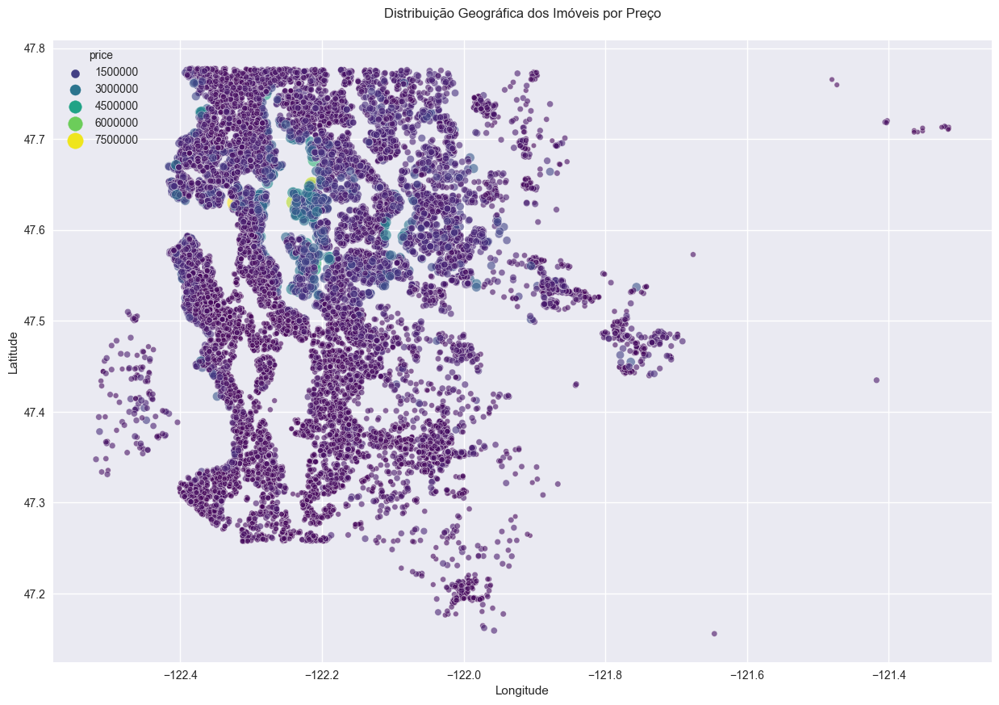

In [33]:
plt.figure(figsize=(15, 10))
sns.scatterplot(
    data=df_sample,
    x='long',
    y='lat',
    hue='price',
    palette='viridis',
    size='price',
    sizes=(20, 200),
    alpha=0.6
)

plt.title('Distribuição Geográfica dos Imóveis por Preço', pad=20)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

**Análise dos Resultados**

1. **Distribuição Espacial**
   - Concentração significativa de imóveis em áreas específicas
   - Formação de clusters evidentes em determinadas coordenadas mais ao centro da distribuição

2. **Padrões de Preço**
   - Gradiente de cores evidencia zonas de valorização

3. **Clusters de Valor**
   - Regiões centrais mostram maior densidade de imóveis de alto valor


**Comentários:**
   - Localização é um fator determinante no preço dos imóveis
   - Existência de "hot spots" de valorização imobiliária
   - Padrão claro de segregação por faixas de preço em uma região

### A seguir iremos visualizar essa mesma distribuição e heatmap em um mapa geográfico, utilizando a biblioteca Folium

In [34]:
# Criar mapa centralizado na média das coordenadas
mapa = folium.Map(
    location=[df_sample['lat'].mean(), df_sample['long'].mean()],
    zoom_start=9,
    tiles='OpenStreetMap'
)

# Adicionar pontos ao mapa
for idx, row in df_sample.iterrows():
    folium.CircleMarker(
        location=[row['lat'], row['long']],
        radius=5,
        color='blue',
        fill=True,
        popup=f'Preço: ${row["price"]:,.2f}',
        weight=2
    ).add_to(mapa)

mapa.save('mapa_imoveis_com_pontos.html')


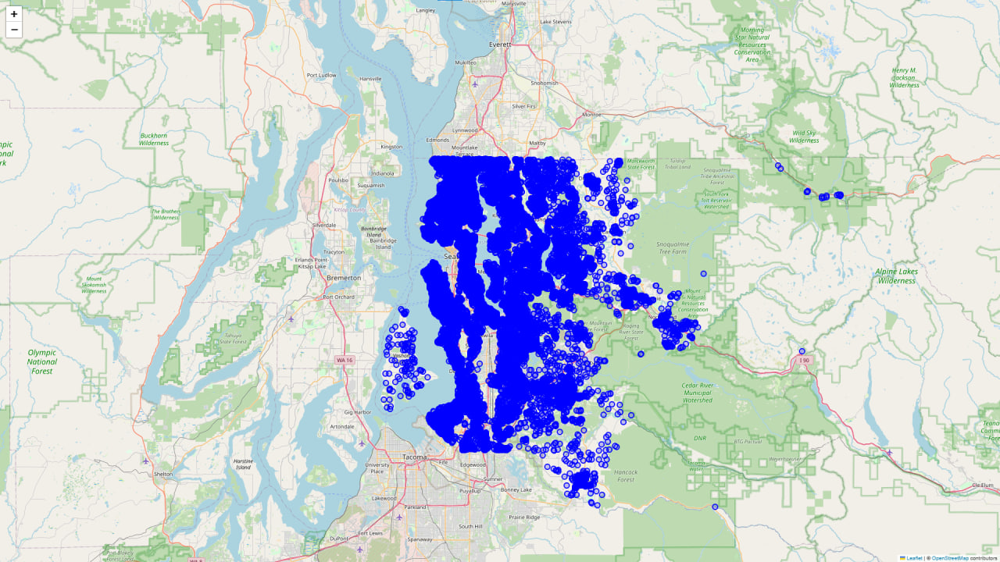

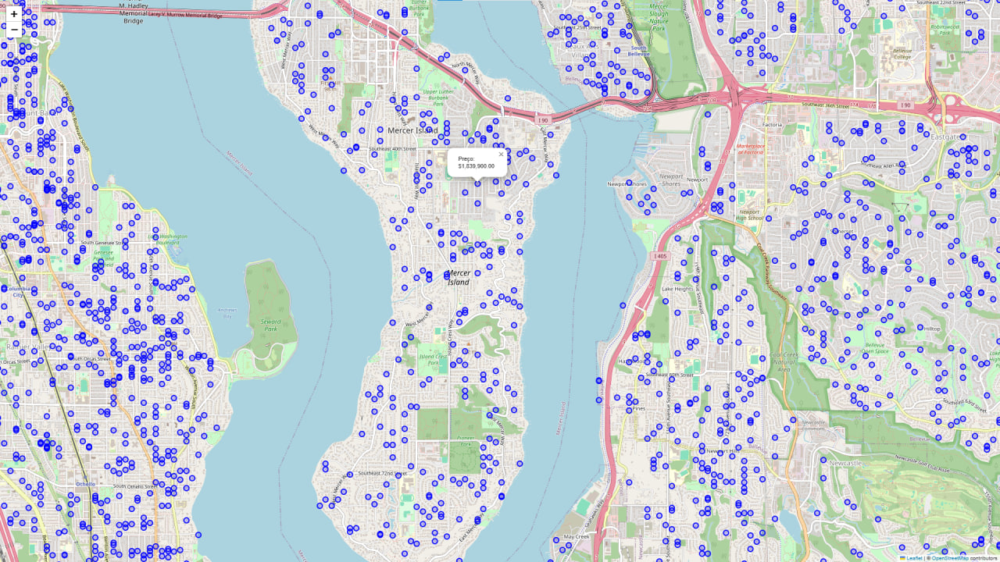

In [35]:
# Criar mapa centralizado na média das coordenadas
mapa = folium.Map(
    location=[df_sample['lat'].mean(), df_sample['long'].mean()],
    zoom_start=9,
    tiles='OpenStreetMap'
)
# Criar dados para o heatmap
dados_heat = df_sample[['lat', 'long', 'price']].values.tolist()
# Adicionar heatmap
HeatMap(dados_heat).add_to(mapa)

# Salvar o mapa
mapa.save('mapa_imoveis_heatmap.html')



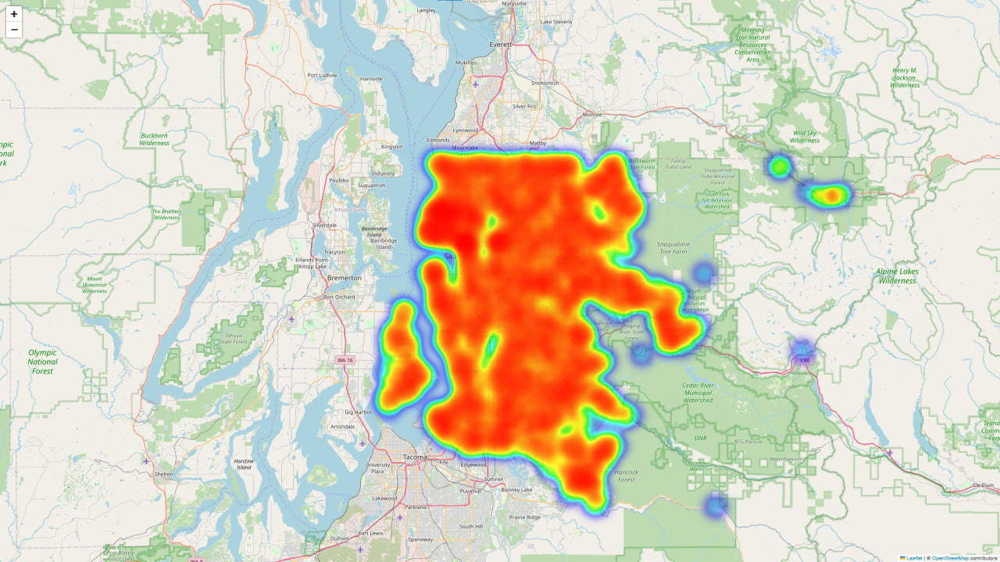

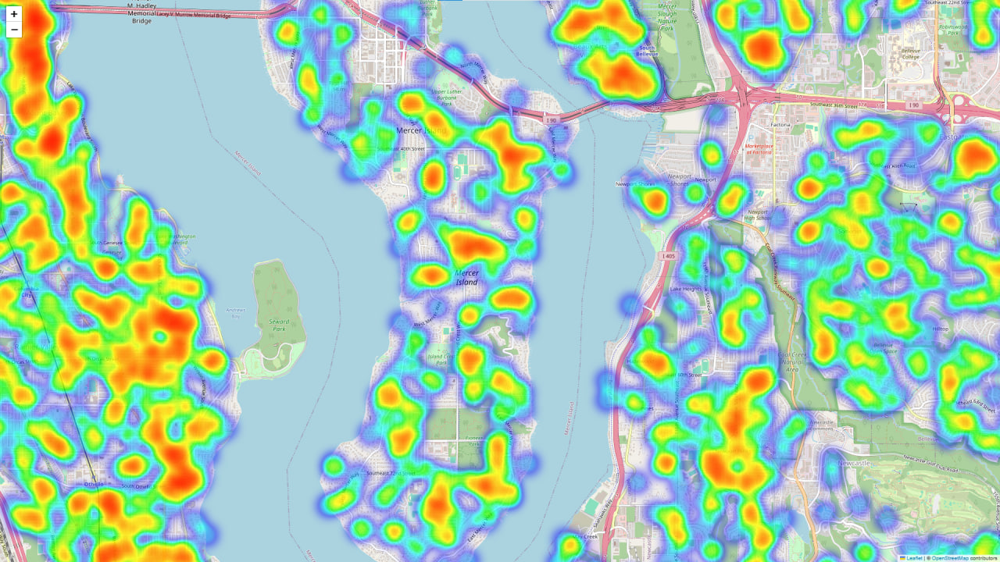

<hr>

# Conclusão da Análise do Mercado Imobiliário

## Síntese dos Resultados

### 1. Análise Temporal
- Imóveis mais recentes apresentam valorização consistente
- Renovações têm impacto significativo no valor final
- Tendência de crescimento nos preços ao longo dos anos

### 2. Características Físicas
- Número de andares correlaciona positivamente com preço
- Vista para água é um forte diferencial de valorização
- Grade (qualidade) é o fator mais impactante no preço

### 3. Distribuição Geográfica
- Clusters claros de valorização em áreas específicas
- Regiões costeiras com preços elevados

## Principais Insights

1. **Valorização Estratégica**
   - Renovações recentes têm ROI significativo
   - Localização tem relação direta com valorização
   - Características físicas e qualidade do imóvel são cruciais
   - Qualidade construtiva (grade) é decisiva no valor

2. **Padrões de Mercado**
   - Forte segmentação por faixas de preço
   - Correlação clara entre reforma e valor

3. **Oportunidades Identificadas**
   - Potencial em imóveis bem localizados para renovação
   - Valor agregado em características específicas

## Exercício de Caso Prático

### Situação
Cliente busca investimento imobiliário com potencial de valorização em médio prazo (5 anos).

### Tarefa
Identificar propriedades com melhor relação custo-benefício e maior potencial de valorização.

### Ação
1. **Análise de Dados**
   - Mapeamento de áreas com crescimento consistente
   - Identificação de imóveis com características subvalorizadas
   - Avaliação de potencial de renovação

2. **Critérios de Seleção**
   - Localização em áreas emergentes próximas a clusters valorizados
   - Imóveis com grade 7-8 (potencial de upgrade)
   - Propriedades sem renovações recentes
   - Vista ou características geográficas favoráveis

3. **Estratégia de Investimento**
   - Foco em propriedades com necessidade de renovação moderada
   - Priorização de áreas com desenvolvimento planejado

### Resultado
- Portfólio de propriedades candidatas com:
  * Potencial de valorização acima da média
  * Necessidades específicas de melhorias
  * Estimativa de ROI pós-renovação

## Recomendações Finais

1. **Para Investidores**
   - Priorizar localização e qualidade construtiva
   - Considerar potencial de renovação

2. **Para Vendedores**
   - Focar em melhorias que impactam o grade
   - Destacar características geográficas favoráveis
   - Timing de venda considerando ciclos de mercado

3. **Para Compradores**
   - Equilibrar localização com estado do imóvel
   - Avaliar custo-benefício de renovações
   - Considerar tendências de longo prazo da região

<hr>
<hr>

### Modelo de Machine Learning
**Objetivo**: Criar um modelo de machine learning para prever o preço dos imóveis com base nas características disponíveis no dataset. Para verificar clique aqui: [Modelo de Machine Learning](https://github.com/alexassuncaodados/House_Sales_Predict/blob/main/02-Modelo.ipynb)